##Introduction

When buying a house, many people have their own preferences and they probably have neighborhood they would like to live within.

With 79 explanatory variables describing almost every aspect of residential homes in Boston, this challenge provides you with an opportunity to predict the final score of a house.

In this project we will experience a deeper understanding of
Exploratory Data analysis
Data Cleaning, specifically, handling missingness in data
Feature enginneering - transforming categorical variables for regression problems, outlier detection
Feature Selection - PCA
Regression models

Data has been borrowed from Kaggle,

##Import Libraries and Data

In [ ]:
# import the relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import datetime
import missingno as msno

from scipy import stats


from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,StandardScaler,PolynomialFeatures
from sklearn.ensemble import RandomForestClassifier


from sklearn.compose import make_column_transformer

from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.model_selection import cross_validate





In [ ]:
df = pd.read_csv('/content/train.csv')
df2 = pd.read_csv('/content/test.csv')

# Get to know your data

In [ ]:
df.head(1)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500


In [ ]:
# change the column names to lower case
df.columns=map(str.lower,df.columns)
df.head()

,id,mssubclass,mszoning,lotfrontage,lotarea,street,alley,lotshape,landcontour,utilities,...,poolarea,poolqc,fence,miscfeature,miscval,mosold,yrsold,saletype,salecondition,saleprice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


# Preliminary Processing

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             1460 non-null   int64  
 1   mssubclass     1460 non-null   int64  
 2   mszoning       1460 non-null   object 
 3   lotfrontage    1201 non-null   float64
 4   lotarea        1460 non-null   int64  
 5   street         1460 non-null   object 
 6   alley          91 non-null     object 
 7   lotshape       1460 non-null   object 
 8   landcontour    1460 non-null   object 
 9   utilities      1460 non-null   object 
 10  lotconfig      1460 non-null   object 
 11  landslope      1460 non-null   object 
 12  neighborhood   1460 non-null   object 
 13  condition1     1460 non-null   object 
 14  condition2     1460 non-null   object 
 15  bldgtype       1460 non-null   object 
 16  housestyle     1460 non-null   object 
 17  overallqual    1460 non-null   int64  
 18  overallc

In [ ]:
df.describe()

,id,mssubclass,lotfrontage,lotarea,overallqual,overallcond,yearbuilt,yearremodadd,masvnrarea,bsmtfinsf1,...,wooddecksf,openporchsf,enclosedporch,3ssnporch,screenporch,poolarea,miscval,mosold,yrsold,saleprice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


# Insights from Basic Data Analysis:
1. We have around 1400 observations and a number of columns have missing values, we will explore these further and determine the missingneess characteristic and treat them accordingly.
2. We have some features that are categorical data and some are numerical
3 - We will explore the distribution of the target variable (sale_price)
4. We have some extra features which are not relevent for building a machine learning model (need to remove them) - Like ID
5. We have categorical variable, Numerical variables in our data

In [ ]:
# Remove extraneous columns
df.drop(['id'], axis=1, inplace=True)

In [ ]:
# Separating the numerical variables from the categorical variables, in case we need to treat them separately
cat_var=df.select_dtypes(include=[object])

In [ ]:
cat_var.head(1)

,mszoning,street,alley,lotshape,landcontour,utilities,lotconfig,landslope,neighborhood,condition1,...,garagetype,garagefinish,garagequal,garagecond,paveddrive,poolqc,fence,miscfeature,saletype,salecondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


In [ ]:
num_var = df.select_dtypes(include=['float','int'])
num_var.head(1)

,mssubclass,lotfrontage,lotarea,overallqual,overallcond,yearbuilt,yearremodadd,masvnrarea,bsmtfinsf1,bsmtfinsf2,...,wooddecksf,openporchsf,enclosedporch,3ssnporch,screenporch,poolarea,miscval,mosold,yrsold,saleprice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,0,61,0,0,0,0,0,2,2008,208500


# EDA

Text(0.5, 1.0, 'Missing Values Heatmap')

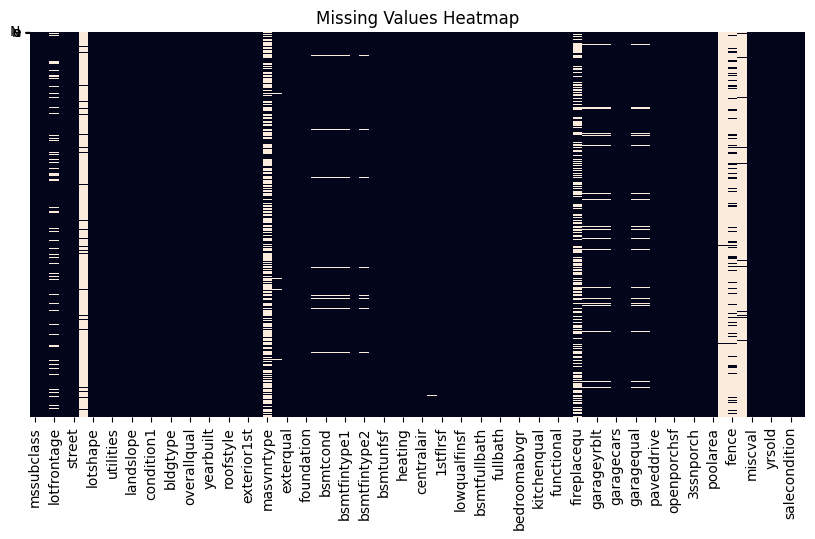

In [ ]:
# Explore missingness
plt.figure(figsize=(10,5))

sns.heatmap(df.isnull(), yticklabels="None", cbar=False)
plt.title("Missing Values Heatmap")

Insights/Deductions
1. We have some missingness in our variables.
2.Drop columns with more than 50% missing
3.Numerical values impute with median because of the presence of outliers
4.Categorical impute with mode

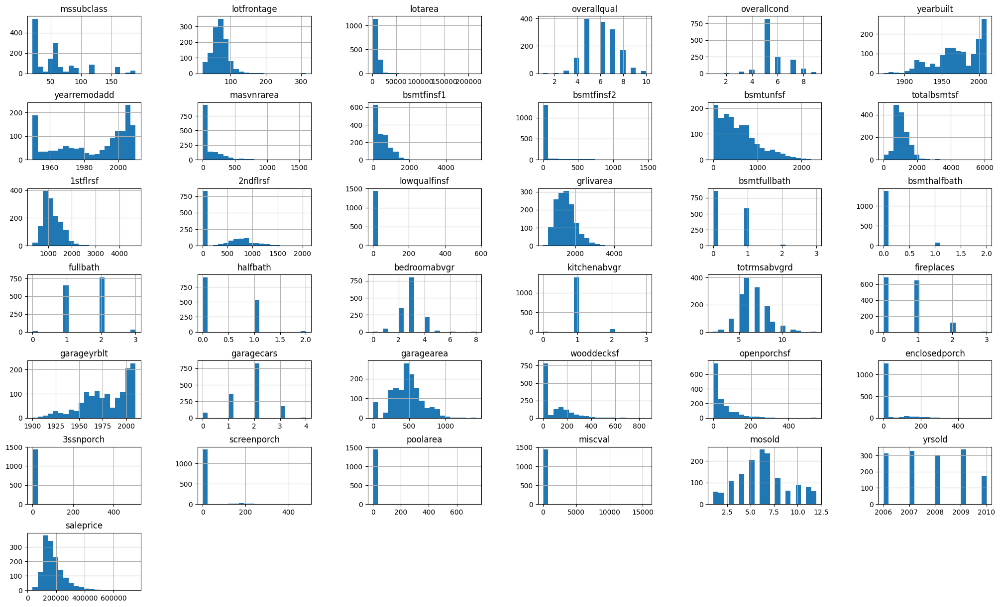

In [ ]:
# Explore The Distribution in the Data

df.hist(figsize=(25,15),bins=20)
plt.subplots_adjust(hspace=0.5,wspace=0.5)

##Insights on Data Distribution
1.mssubclass,grlvarea,yearsold,garageyrblt have uniform distribution
2.mosold,garagearea,lotfrontage,lstflrsf,sale price have a Gaussian distribution
3.screenporch,poolarea,miscal,enclosed porch have data skewed towards the right(can indicate outliers)
4.Normally distributed data is well suited for a regression problem like in our case


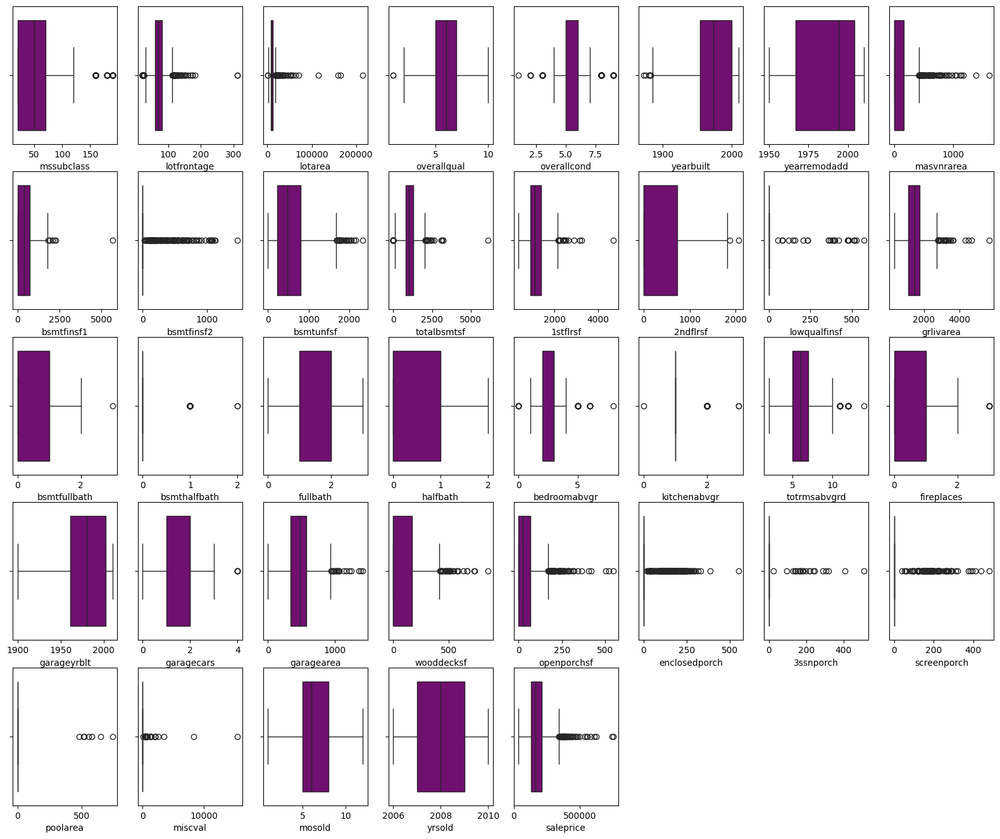

In [ ]:
## Explore presecence of outliers
# Uni-variate analysis of all the numerical variables - we are trying to see if there are outliers.
fig = plt.figure(figsize=(20,30))
for i,j in zip(num_var,range(len(num_var.columns))):
    ax = fig.add_subplot(9,8, j+1)
    sns.boxplot(data=df,x=df[i],color="Purple")

##Insights from Exploratory Data Analysis:
1.Most of the numerical variables have outliers
2.Inituition: We will need a model that takes care of outliers or may need to treat the outliers, before modelling

In [ ]:
## Pairplot

sns.pairplot(df)

# Data Prep

In [ ]:
## Missing values
# For columns with more than 50% missing we are going to delete
df.dropna(thresh=df.shape[0]*0.5,axis=1, inplace = True)

## For other colums we are doing a median for numerical and mode for the categorical
fill = dict()

for i in range(len(df.columns)):

    if df.columns[i] in num_var:
        fill[df.columns[i]] = df[df.columns[i]].median()

    else:
        fill[df.columns[i]] = str(df[df.columns[i]].mode()).split()[1]

print(len(fill))
df = df.fillna(value=fill)

75


In [ ]:
df.head()

,mssubclass,mszoning,lotfrontage,lotarea,street,lotshape,landcontour,utilities,lotconfig,landslope,...,enclosedporch,3ssnporch,screenporch,poolarea,miscval,mosold,yrsold,saletype,salecondition,saleprice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,12,2008,WD,Normal,250000


In [ ]:
cat_var.head(1)

,mszoning,street,alley,lotshape,landcontour,utilities,lotconfig,landslope,neighborhood,condition1,...,garagetype,garagefinish,garagequal,garagecond,paveddrive,poolqc,fence,miscfeature,saletype,salecondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


In [ ]:
cat_var.columns

Index(['mszoning', 'street', 'alley', 'lotshape', 'landcontour', 'utilities',
       'lotconfig', 'landslope', 'neighborhood', 'condition1', 'condition2',
       'bldgtype', 'housestyle', 'roofstyle', 'roofmatl', 'exterior1st',
       'exterior2nd', 'masvnrtype', 'exterqual', 'extercond', 'foundation',
       'bsmtqual', 'bsmtcond', 'bsmtexposure', 'bsmtfintype1', 'bsmtfintype2',
       'heating', 'heatingqc', 'centralair', 'electrical', 'kitchenqual',
       'functional', 'fireplacequ', 'garagetype', 'garagefinish', 'garagequal',
       'garagecond', 'paveddrive', 'poolqc', 'fence', 'miscfeature',
       'saletype', 'salecondition'],
      dtype='object')

In [ ]:
num_var.columns

Index(['mssubclass', 'lotfrontage', 'lotarea', 'overallqual', 'overallcond',
       'yearbuilt', 'yearremodadd', 'masvnrarea', 'bsmtfinsf1', 'bsmtfinsf2',
       'bsmtunfsf', 'totalbsmtsf', '1stflrsf', '2ndflrsf', 'lowqualfinsf',
       'grlivarea', 'bsmtfullbath', 'bsmthalfbath', 'fullbath', 'halfbath',
       'bedroomabvgr', 'kitchenabvgr', 'totrmsabvgrd', 'fireplaces',
       'garageyrblt', 'garagecars', 'garagearea', 'wooddecksf', 'openporchsf',
       'enclosedporch', '3ssnporch', 'screenporch', 'poolarea', 'miscval',
       'mosold', 'yrsold', 'saleprice'],
      dtype='object')

In [ ]:
categ =['mszoning', 'street', 'lotshape', 'landcontour','utilities',
       'lotconfig', 'landslope', 'neighborhood','condition1','condition2',
       'bldgtype', 'housestyle', 'roofstyle', 'roofmatl', 'exterior1st',
       'exterior2nd','exterqual', 'extercond', 'foundation',
       'bsmtqual', 'bsmtcond', 'bsmtexposure', 'bsmtfintype1', 'bsmtfintype2',
       'heating', 'heatingqc', 'centralair', 'electrical', 'kitchenqual',
       'functional', 'fireplacequ', 'garagetype', 'garagefinish', 'garagequal',
       'garagecond', 'paveddrive',
       'saletype', 'salecondition']

In [ ]:
discrete=[x for x in num_var.columns if len(df[x].unique())<25]

In [ ]:
discrete

['mssubclass',
 'overallqual',
 'overallcond',
 'lowqualfinsf',
 'bsmtfullbath',
 'bsmthalfbath',
 'fullbath',
 'halfbath',
 'bedroomabvgr',
 'kitchenabvgr',
 'totrmsabvgrd',
 'fireplaces',
 'garagecars',
 '3ssnporch',
 'poolarea',
 'miscval',
 'mosold',
 'yrsold']

In [ ]:
temporal_vars=[x for x in df.columns if 'yr' in x or  'year' in x]
temporal_vars

['yearbuilt', 'yearremodadd', 'garageyrblt', 'yrsold']

In [ ]:
continous_numerical=[x for x in num_var.columns if x not in temporal_vars+["id"] and x not in discrete]
#Continous datarefers to data that can be measured.
continous_numerical

['lotfrontage',
 'lotarea',
 'masvnrarea',
 'bsmtfinsf1',
 'bsmtfinsf2',
 'bsmtunfsf',
 'totalbsmtsf',
 '1stflrsf',
 '2ndflrsf',
 'grlivarea',
 'garagearea',
 'wooddecksf',
 'openporchsf',
 'enclosedporch',
 'screenporch',
 'saleprice']

In [ ]:
#encoding
#Encoding Data -One Hot for Categorical Variable

encoder = OneHotEncoder(sparse_output=False)


encoded_data = encoder.fit_transform(df[['mszoning', 'street', 'lotshape', 'landcontour','utilities',
       'lotconfig', 'landslope', 'neighborhood','condition1','condition2',
       'bldgtype', 'housestyle', 'roofstyle', 'roofmatl', 'exterior1st',
       'exterior2nd','exterqual', 'extercond', 'foundation',
       'bsmtqual', 'bsmtcond', 'bsmtexposure', 'bsmtfintype1', 'bsmtfintype2',
       'heating', 'heatingqc', 'centralair', 'electrical', 'kitchenqual',
       'functional', 'fireplacequ', 'garagetype', 'garagefinish', 'garagequal',
       'garagecond', 'paveddrive',
       'saletype', 'salecondition']])

In [ ]:
encoded_data

array([[0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.]])

In [ ]:
encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out(['mszoning', 'street', 'lotshape', 'landcontour','utilities',
       'lotconfig', 'landslope', 'neighborhood','condition1','condition2',
       'bldgtype', 'housestyle', 'roofstyle', 'roofmatl', 'exterior1st',
       'exterior2nd','exterqual', 'extercond', 'foundation',
       'bsmtqual', 'bsmtcond', 'bsmtexposure', 'bsmtfintype1', 'bsmtfintype2',
       'heating', 'heatingqc', 'centralair', 'electrical', 'kitchenqual',
       'functional', 'fireplacequ', 'garagetype', 'garagefinish', 'garagequal',
       'garagecond', 'paveddrive',
       'saletype', 'salecondition']))


In [ ]:
encoded_df

,mszoning_C (all),mszoning_FV,mszoning_RH,mszoning_RL,mszoning_RM,street_Grvl,street_Pave,lotshape_IR1,lotshape_IR2,lotshape_IR3,...,saletype_ConLw,saletype_New,saletype_Oth,saletype_WD,salecondition_Abnorml,salecondition_AdjLand,salecondition_Alloca,salecondition_Family,salecondition_Normal,salecondition_Partial
0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1456,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1457,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1458,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
#ordinal encode for discrete variables
enc = OrdinalEncoder()
df[['mssubclass','overallqual','overallcond','lowqualfinsf',
   'bsmtfullbath', 'bsmthalfbath', 'fullbath', 'halfbath',
 'bedroomabvgr', 'kitchenabvgr', 'totrmsabvgrd', 'fireplaces',
    'garagecars', '3ssnporch', 'poolarea', 'miscval',
 'mosold', 'yrsold']] = enc.fit_transform(df[['mssubclass','overallqual',
    'overallcond','lowqualfinsf',
   'bsmtfullbath', 'bsmthalfbath', 'fullbath', 'halfbath',
 'bedroomabvgr', 'kitchenabvgr', 'totrmsabvgrd', 'fireplaces',
    'garagecars', '3ssnporch', 'poolarea', 'miscval',
 'mosold', 'yrsold']])

In [ ]:
ord_data=enc.fit_transform(df[['mssubclass','overallqual',
    'overallcond','lowqualfinsf',
   'bsmtfullbath', 'bsmthalfbath', 'fullbath', 'halfbath',
 'bedroomabvgr', 'kitchenabvgr', 'totrmsabvgrd', 'fireplaces',
    'garagecars', '3ssnporch', 'poolarea', 'miscval',
 'mosold', 'yrsold']])

In [ ]:
ord_data

array([[ 5.,  6.,  4., ...,  0.,  1.,  2.],
       [ 0.,  5.,  7., ...,  0.,  4.,  1.],
       [ 5.,  6.,  4., ...,  0.,  8.,  2.],
       ...,
       [ 6.,  6.,  8., ..., 17.,  4.,  4.],
       [ 0.,  4.,  5., ...,  0.,  3.,  4.],
       [ 0.,  4.,  5., ...,  0.,  5.,  2.]])

In [ ]:
ord_data_df = pd.DataFrame(ord_data, columns=enc.get_feature_names_out(['mssubclass','overallqual',
    'overallcond','lowqualfinsf',
   'bsmtfullbath', 'bsmthalfbath', 'fullbath', 'halfbath',
 'bedroomabvgr', 'kitchenabvgr', 'totrmsabvgrd', 'fireplaces',
    'garagecars', '3ssnporch', 'poolarea', 'miscval',
 'mosold', 'yrsold']))

In [ ]:
ord_data_df

,mssubclass,overallqual,overallcond,lowqualfinsf,bsmtfullbath,bsmthalfbath,fullbath,halfbath,bedroomabvgr,kitchenabvgr,totrmsabvgrd,fireplaces,garagecars,3ssnporch,poolarea,miscval,mosold,yrsold
0,5.0,6.0,4.0,0.0,1.0,0.0,2.0,1.0,3.0,1.0,6.0,0.0,2.0,0.0,0.0,0.0,1.0,2.0
1,0.0,5.0,7.0,0.0,0.0,1.0,2.0,0.0,3.0,1.0,4.0,1.0,2.0,0.0,0.0,0.0,4.0,1.0
2,5.0,6.0,4.0,0.0,1.0,0.0,2.0,1.0,3.0,1.0,4.0,1.0,2.0,0.0,0.0,0.0,8.0,2.0
3,6.0,6.0,4.0,0.0,1.0,0.0,1.0,0.0,3.0,1.0,5.0,1.0,3.0,0.0,0.0,0.0,1.0,0.0
4,5.0,7.0,4.0,0.0,1.0,0.0,2.0,1.0,4.0,1.0,7.0,1.0,3.0,0.0,0.0,0.0,11.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,5.0,5.0,4.0,0.0,0.0,0.0,2.0,1.0,3.0,1.0,5.0,1.0,2.0,0.0,0.0,0.0,7.0,1.0
1456,0.0,5.0,5.0,0.0,1.0,0.0,2.0,0.0,3.0,1.0,5.0,2.0,2.0,0.0,0.0,0.0,1.0,4.0
1457,6.0,6.0,8.0,0.0,0.0,0.0,2.0,0.0,4.0,1.0,7.0,2.0,1.0,0.0,0.0,17.0,4.0,4.0
1458,0.0,4.0,5.0,0.0,1.0,0.0,1.0,0.0,2.0,1.0,3.0,0.0,1.0,0.0,0.0,0.0,3.0,4.0


In [ ]:
#Separate the X and Y
X = df.drop(columns='saleprice')
y = df['saleprice']


In [ ]:
#drop columns are encoded
X.drop(columns=['mszoning', 'street', 'lotshape', 'landcontour','utilities',
       'lotconfig', 'landslope', 'neighborhood','condition1','condition2',
       'bldgtype', 'housestyle', 'roofstyle', 'roofmatl', 'exterior1st',
       'exterior2nd','exterqual', 'extercond', 'foundation',
       'bsmtqual', 'bsmtcond', 'bsmtexposure', 'bsmtfintype1', 'bsmtfintype2',
       'heating', 'heatingqc', 'centralair', 'electrical', 'kitchenqual',
       'functional', 'fireplacequ', 'garagetype', 'garagefinish', 'garagequal',
       'garagecond', 'paveddrive',
       'saletype', 'salecondition'],inplace=True)

In [ ]:
# Concatenate the original DataFrame with the encoded DataFrame
encoded_data = pd.concat([X, encoded_df,ord_data_df], axis=1)


In [ ]:
encoded_data.head()

,mssubclass,lotfrontage,lotarea,overallqual,overallcond,yearbuilt,yearremodadd,masvnrarea,bsmtfinsf1,bsmtfinsf2,...,bedroomabvgr,kitchenabvgr,totrmsabvgrd,fireplaces,garagecars,3ssnporch,poolarea,miscval,mosold,yrsold
0,5.0,65.0,8450,6.0,4.0,2003,2003,196.0,706,0,...,3.0,1.0,6.0,0.0,2.0,0.0,0.0,0.0,1.0,2.0
1,0.0,80.0,9600,5.0,7.0,1976,1976,0.0,978,0,...,3.0,1.0,4.0,1.0,2.0,0.0,0.0,0.0,4.0,1.0
2,5.0,68.0,11250,6.0,4.0,2001,2002,162.0,486,0,...,3.0,1.0,4.0,1.0,2.0,0.0,0.0,0.0,8.0,2.0
3,6.0,60.0,9550,6.0,4.0,1915,1970,0.0,216,0,...,3.0,1.0,5.0,1.0,3.0,0.0,0.0,0.0,1.0,0.0
4,5.0,84.0,14260,7.0,4.0,2000,2000,350.0,655,0,...,4.0,1.0,7.0,1.0,3.0,0.0,0.0,0.0,11.0,2.0


In [ ]:
#Spliting the data test and train
X_train, X_test, y_train, y_test = train_test_split(encoded_data, y, test_size=0.3, random_state = 1)


In [ ]:
print(f" Training set : {X_train.shape}")
print(f" Testing set  :  {X_test.shape}")


 Training set : (1022, 289)
 Testing set  :  (438, 289)


In [ ]:
#Feature Scaling

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
#Robust Scaling good for data sets with outliers like ours
# scale all data points using median and IQR
#robust_scaled_data = robust_scaler.transform(data_df)

# Model Selection

In [ ]:

lin_model = LinearRegression()


lin_model.fit(X_train_scaled,y_train)


LinearRegression()

In [ ]:
# Coefficients
coefficients = lin_model.coef_
intercept = lin_model.intercept_
print(f"Coefficients : {coefficients}")
print(f"Intercept : {intercept}")

Coefficients : [-3.43461640e+14  1.54406250e+02  8.20414062e+03 -3.10032760e+15
 -3.98373864e+15  4.84717188e+03  1.56350000e+03  2.59615625e+03
  8.59086233e+15  3.05726199e+15  8.13299589e+15 -8.31122844e+15
  5.53536562e+04  6.58630156e+04  1.29775852e+16 -5.04528594e+04
 -1.84935717e+15  6.89134178e+14 -9.32266987e+15  7.65819893e+14
  6.11656039e+15  8.92392290e+15  4.94792017e+15  2.60342001e+15
 -5.69996094e+02 -3.58033858e+15  6.70483789e+03  1.23403906e+03
  8.74273438e+02  3.71002930e+02 -6.11934919e+15  1.82221777e+03
 -1.04117732e+15 -3.52577349e+15  2.20527276e+14  7.85900221e+15
 -7.50710440e+15 -2.72302211e+16 -1.29643490e+16 -5.60676557e+16
 -5.00360037e+16 -1.68037170e+15 -1.68037170e+15  2.92664888e+15
  1.02691110e+15  4.72478122e+14  2.99054765e+15  2.68780527e+15
  2.01760787e+15  1.98088692e+15  3.77083336e+15  8.28496559e+14
  8.28496559e+14 -2.97711950e+15 -1.95900202e+15 -1.30454187e+15
 -4.11517271e+14 -3.46393372e+15  6.35309941e+15  5.93132404e+15
  2.384405

In [ ]:
lin_train_pred = lin_model.predict(X_train_scaled)
mean_squared_error(y_train, lin_train_pred)


401400529.04011077

In [ ]:
mean_absolute_error(y_train,lin_train_pred)

12778.365763261532

# Prediction and Evaluation on the linear model

In [ ]:
lin_pred = lin_model.predict(X_test_scaled)


In [ ]:
mse = mean_squared_error(y_test, lin_pred)
mae = mean_absolute_error(y_test, lin_pred)
print(f"Linear Model Error(MSE) : {mse}")
print(f"Linear Model Error(MAE) : {mae}")

Linear Model Error(MSE) : 2.174496589784609e+31
Linear Model Error(MAE) : 465536554442996.5


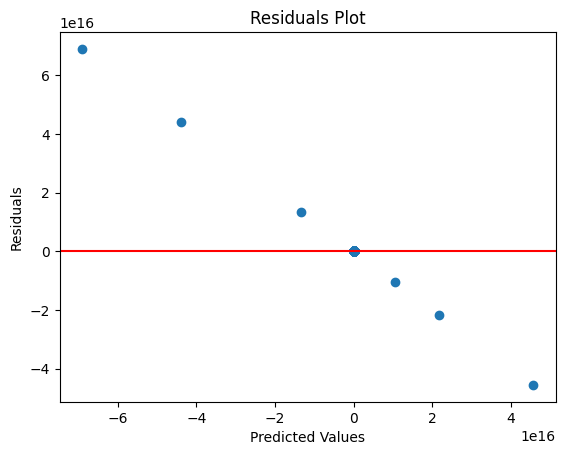

In [ ]:
residuals = y_test - lin_pred

# Plot residuals against predicted values
plt.scatter(lin_pred, residuals)
plt.axhline(y=0, color='r', linestyle='-')  # Add horizontal line at y=0
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.show()


##Polynomial Regression

In [ ]:

degrees = [1,2,3,4,5]  # Various degrees to try

for degree in degrees:
    # Create polynomial features
    poly = PolynomialFeatures(degree=degree)
    X_poly_train = poly.fit_transform(X_train_scaled)
    X_poly_test = poly.transform(X_test_scaled)

    # Fit polynomial regression model
    model = LinearRegression()
    model.fit(X_poly_train, y_train)

    # Make predictions
    y_pred = model.predict(X_poly_test)

    # Calculate MSE
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    print(f'Degree {degree}: MSE = {mse}')
    print(f'Degree {degree}: MAE = {mae}')


Degree 1: MSE = 1.731985988607539e+30
Degree 1: MAE = 118618416362755.94
Degree 2: MSE = 1514981045.3407333
Degree 2: MAE = 26130.0729216862
